# Find Inference Hyperparameters for Individual 95 in Lung Cancer Control Group

## Show control group data

In [1]:
import erlotinib as erlo

# Get data
data = erlo.DataLibrary().lung_cancer_control_group()

# Create scatter plot
fig = erlo.plots.PDTimeSeriesPlot()
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')

# Show figure
fig.show()

**Figure 1:** Visualisation of the measured tumour growth in 8 mice with patient-derived lung cancer implants.

## Build model

In [2]:
# Define mechanistic model
path = erlo.ModelLibrary().tumour_growth_inhibition_model_koch_reparametrised()
mechanistic_model = erlo.PharmacodynamicModel(path)
mechanistic_model.set_parameter_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3',
    'myokit.critical_volume': 'Critical volume in cm^3',
    'myokit.drug_concentration': 'Drug concentration in mg/L',
    'myokit.kappa': 'Potency in L/mg/day',
    'myokit.lambda': 'Exponential growth rate in 1/day'})

# Define error model
error_model = erlo.ConstantAndMultiplicativeGaussianErrorModel()

# Compose model and not identified parameters
problem = erlo.ProblemModellingController(mechanistic_model, error_model)
problem.fix_parameters({
    'Drug concentration in mg/L': 0,
    'Potency in L/mg/day': 0})

## Prior Predictive Check

In [3]:
import numpy as np
import pints

# Define prior distribution
log_priors = [
    pints.TruncatedGaussianLogPrior(mean=0.25, sd=0.1, a=0, b=np.inf),   # Initial tumour volume
    pints.TruncatedGaussianLogPrior(mean=1, sd=1, a=0, b=np.inf),        # Critical volume
    pints.TruncatedGaussianLogPrior(mean=0.1, sd=0.1, a=0, b=np.inf),    # Growth rate
    pints.TruncatedGaussianLogPrior(mean=0, sd=0.1, a=0, b=np.inf),      # Sigma base
    pints.TruncatedGaussianLogPrior(mean=0, sd=0.2, a=0, b=np.inf)]      # Sigma rel.
log_prior = pints.ComposedLogPrior(*log_priors)

# Compose prior predictive model
predictive_model = problem.get_predictive_model()
prior_predictive_model = erlo.PriorPredictiveModel(
    predictive_model, log_prior)

# Sample from prior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = prior_predictive_model.sample(times, n_samples)

# Illustrate prior predictive model
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples, bulk_probs=[0.3, 0.6, 0.9])
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

**Figure 2:** Prior predictive model of tumour volume measurement over time. The shaded areas estimate the 0.3, 0.6 and 0.9 bulk probability of the prior predictive distribution by sampling 1000 virtual "measurements" at each of the 50 equidistant time points.

## Find posterior probability distribution

In [4]:
# Create log-posteriors
problem.set_data(data, output_biomarker_dict={'myokit.tumour_volume': 'Tumour volume'})
problem.set_log_prior(log_priors)
log_posteriors = problem.get_log_posterior(individual='95')

# Set up sampling controller
sampler = erlo.SamplingController(log_posteriors)
sampler.set_transform(transform=pints.LogTransformation(n_parameters=5))
sampler.set_n_runs(5)

# Run sampling
n_iterations = 40000
posterior_samples = sampler.run(n_iterations=n_iterations, show_progress_bar=True)

## Find hyperparameters for good convergence

In [5]:
import xarray as xr

def to_xarray_dataset(data):
    """
    Takes a pandas.DataFrame with posterior samples and returns it in form of a xarray.Dataset.
    
    Extends version one to hierarchical modelling results.

    #TODO: Reference dataset is starting to count chains and draws with 0
    """
    # Get number of iterations and number of chains
    draws = data['Iteration'].unique()
    n_draws = len(draws)
    chains = data['Run'].unique()
    n_chains = len(chains)

    # Sort samples of parameters into xarrays
    container = {}
    parameter_names = data['Parameter'].unique()
    for param_id, parameter in enumerate(parameter_names):
        # Mask dataframe for parameter
        mask = data['Parameter'] == parameter
        temp = data[mask]

        # Get the number of individuals for this parameter (population parameters will have ID ``None``)
        ids = temp['ID'].dropna().unique()
        n_ids = len(ids)

        # Sort samples for population parameters
        if n_ids == 0:
            # Create conatiner for samples
            samples = np.empty(shape=(n_chains, n_draws), dtype=float)

            # Fill samples for each chain
            for chain_id, chain in enumerate(chains):
                # Mask samples for chain and fill container
                mask = temp['Run'] == chain
                samples[chain_id] = temp[mask]['Sample'].to_numpy()

            # Convert samples to xarray
            samples = xr.DataArray(
                data=samples,
                dims=['chain', 'draw'],
                coords={'chain': list(chains-1), 'draw': list(draws-1)})
        
        # Sort samples for individual parameters
        else:
            # Create conatiner for samples
            samples = np.empty(shape=(n_chains, n_draws, n_ids), dtype=float)

            for _id_id, _id in enumerate(ids):
                # Mask for id
                mask = temp['ID'] == _id
                temp2 = temp[mask]

                # Fill samples for each chain
                for chain_id, chain in enumerate(chains):
                    # Mask samples for chain and fill container
                    mask = temp2['Run'] == chain
                    samples[chain_id, :, _id_id] = temp2[mask]['Sample'].to_numpy()

            # Convert samples to xarray
            samples = xr.DataArray(
                data=samples,
                dims=['chain', 'draw', 'individual'],
                coords={
                    'chain': list(chains-1), 
                    'draw': list(draws-1),
                    'individual': list(ids)})
        
        # Add samples to dictionary
        container[parameter] = samples

    # Convert to xarray.Dataset and return
    return xr.Dataset(container)

In [6]:
xarray_samples = to_xarray_dataset(posterior_samples)

### Individual 95

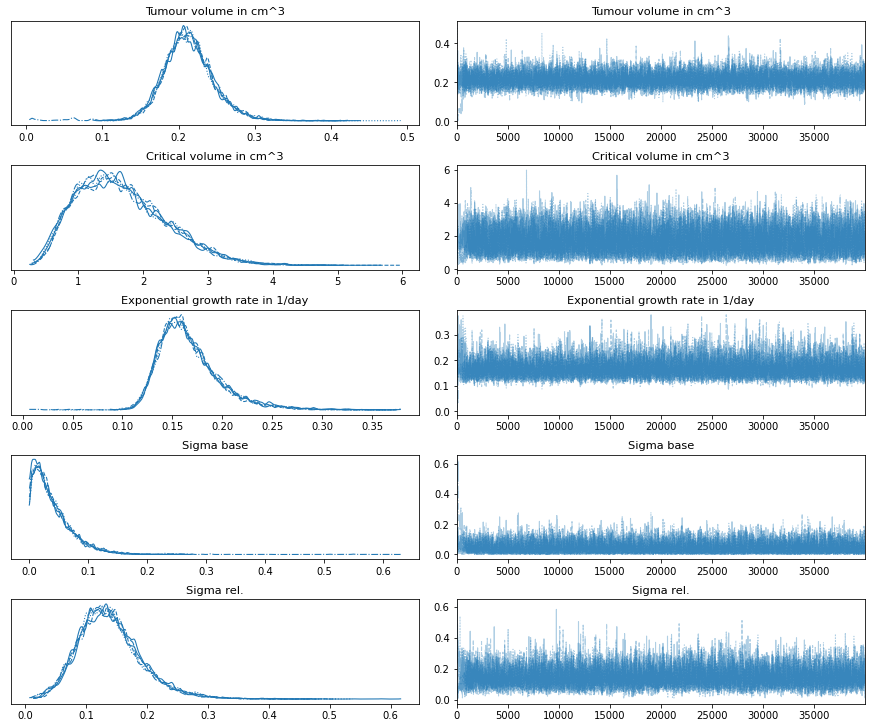

In [7]:
import arviz as az
import matplotlib.pyplot as plt

az.plot_trace(xarray_samples)
plt.show()

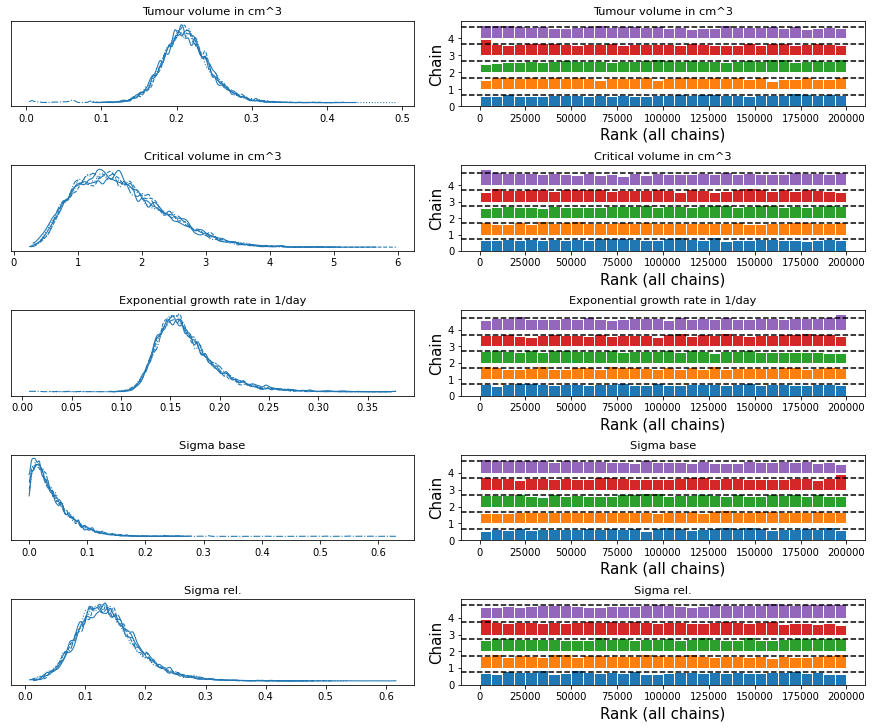

In [8]:
az.plot_trace(xarray_samples, kind='rank_bars')
plt.show()

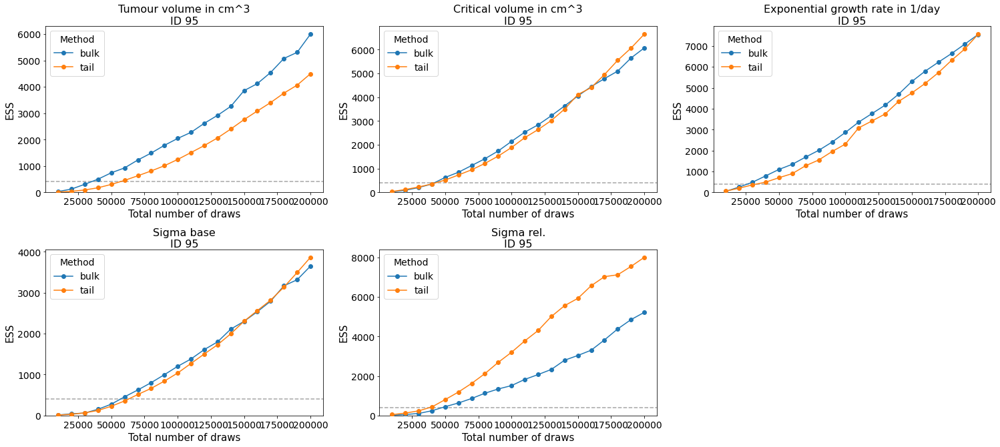

In [9]:
az.plot_ess(xarray_samples, kind="evolution")
plt.show()

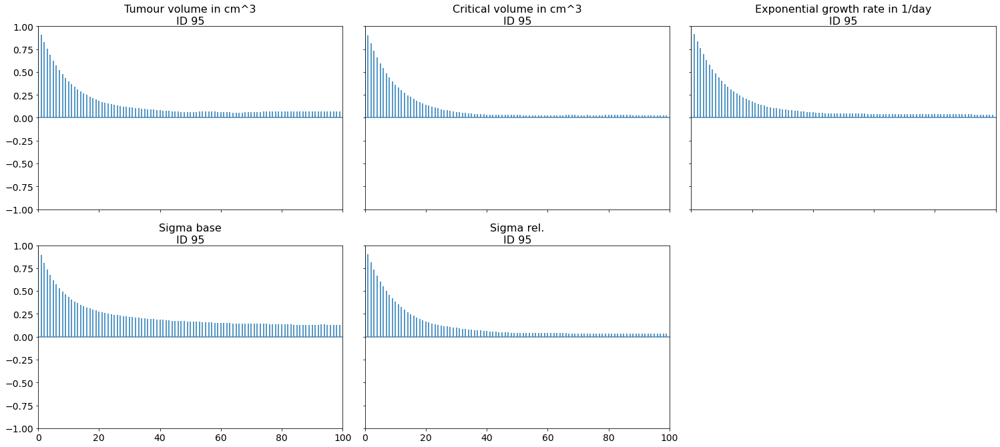

In [10]:
az.plot_autocorr(xarray_samples, combined=True)
plt.show()

### Exclude warmup

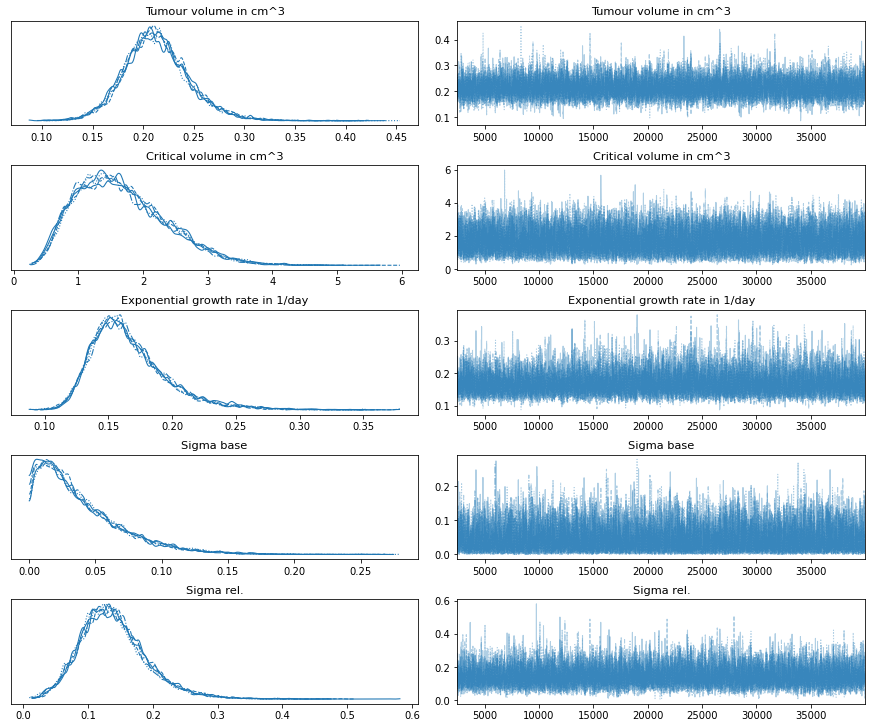

In [11]:
warmup = 2500

az.plot_trace(xarray_samples.sel(draw=slice(warmup, n_iterations)))
plt.show()

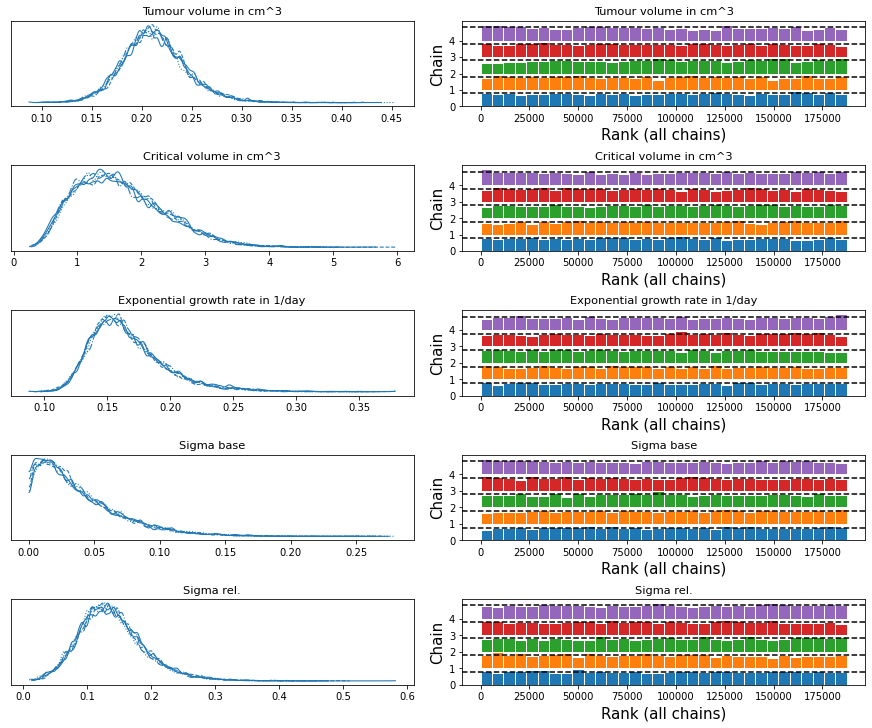

In [12]:
az.plot_trace(xarray_samples.sel(draw=slice(warmup, n_iterations)), kind='rank_bars')
plt.show()

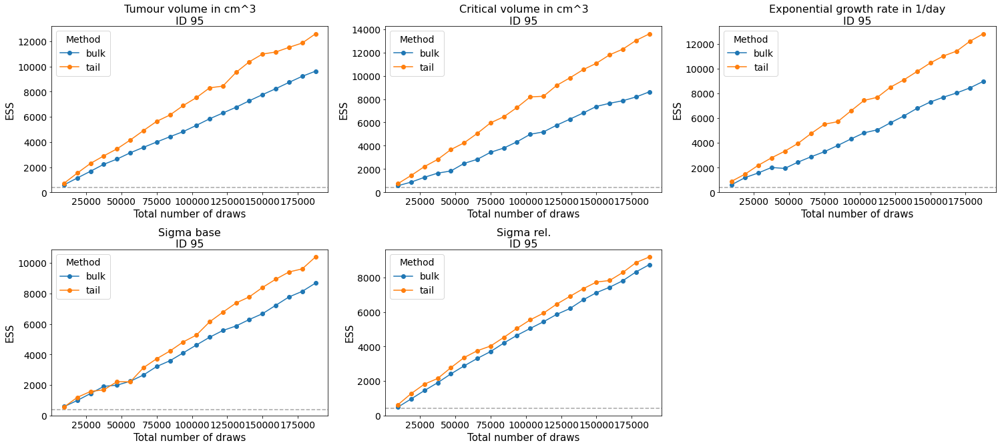

In [13]:
az.plot_ess(xarray_samples.sel(draw=slice(warmup, n_iterations)), kind="evolution")
plt.show()

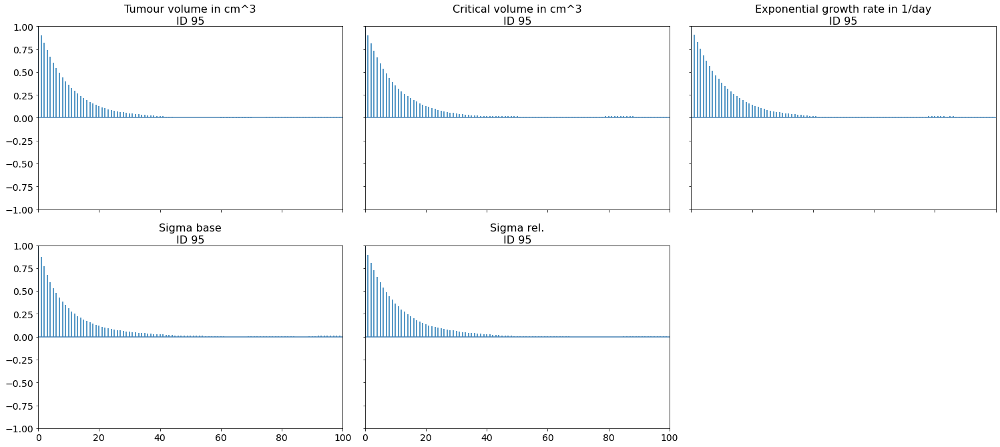

In [14]:
az.plot_autocorr(xarray_samples.sel(draw=slice(warmup, n_iterations)), combined=True)
plt.show()

### Reduce correlations by thinning out

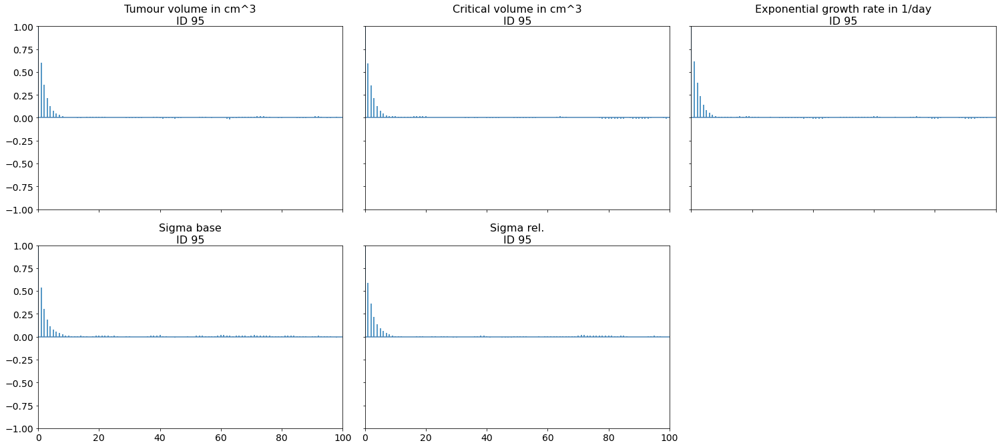

In [18]:
thinning_ratio = 5

az.plot_autocorr(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), combined=True)
plt.show()

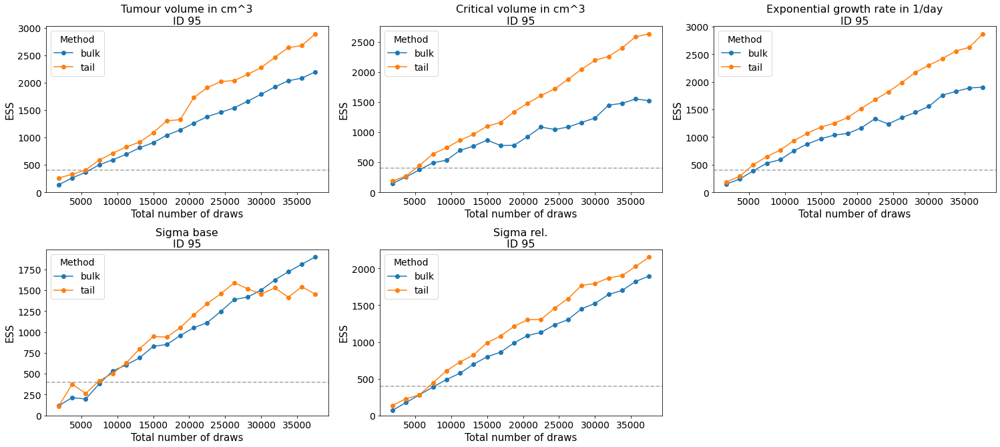

In [19]:
az.plot_ess(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind="evolution")
plt.show()

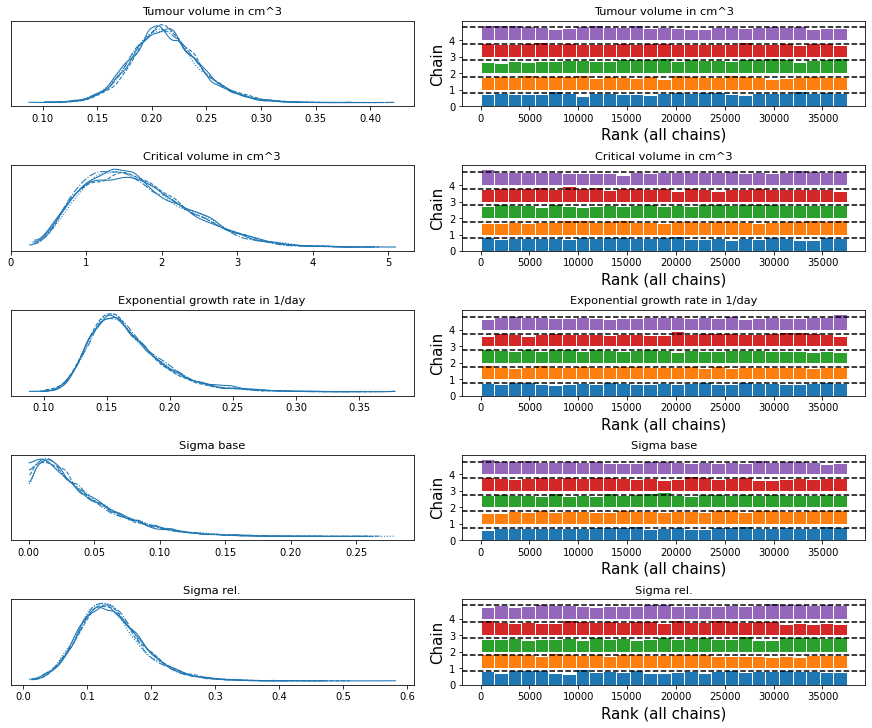

In [20]:
az.plot_trace(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)), kind='rank_bars')
plt.show()

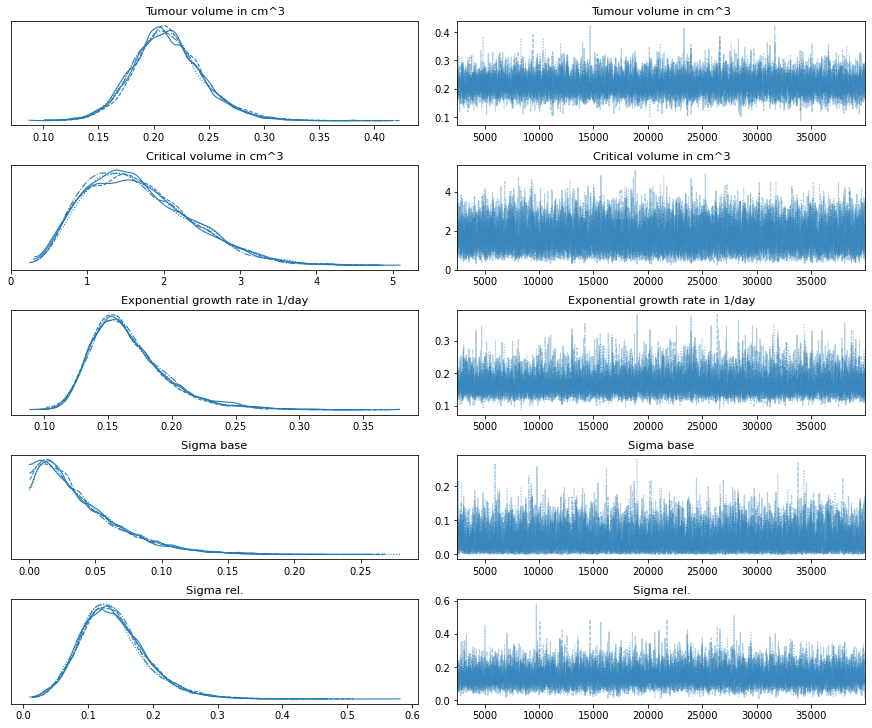

In [21]:
az.plot_trace(xarray_samples.sel(draw=slice(warmup, n_iterations, thinning_ratio)))
plt.show()

## Save posterior

In [22]:
import os

# Rename parameters
temp = xarray_samples.rename({
    'Tumour volume in cm^3': 'initial_tumour_volume',
    'Critical volume in cm^3': 'critical_volume',
    'Exponential growth rate in 1/day': 'growth_rate',
    'Sigma base': 'sigma_base',
    'Sigma rel.': 'sigma_rel'})

# Export samples
directory = os.getcwd()
name = '/posteriors/id_95.nc'
temp.sel(draw=slice(warmup, n_iterations, thinning_ratio)).to_netcdf(directory + name)